In [2]:
import bptf
from bptf import BPTF
import numpy as np
import pandas as pd
import sparse
import os
import shutil
from tqdm import tqdm
import pickle
import scipy.stats as st
import matplotlib.pyplot as plt
import torch
import tensorly
import cupy

import multiprocessing
from joblib import Parallel, delayed
from tqdm.contrib.concurrent import process_map

import gc
gc.collect()

20

In [3]:
os.getcwd()
# tensorly.set_backend('pytorch')

'c:\\Users\\luiyu\\OneDrive - The University of Chicago\\UChicago_MS_Stat\\aaron_schein\\bptf_new'

In [4]:
def dataframe_to_sparse_tensor(data, country_indices, date_indices, database_indices, cameo_col='CAMEO_Code', events_col='Num_Events'):
    """
    Converts a pandas DataFrame into an sptensor.
    
    Parameters:
        data (pd.DataFrame): The DataFrame containing the data.
        country_indices (pd.DataFrame): DataFrame with country indices.
        date_indices (pd.DataFrame): DataFrame with date indices.
        database_indices (pd.DataFrame): DataFrame with database indices.
        cameo_col (str): Name of the CAMEO code column in 'data'. Defaults to 'CAMEO_Code'.
        events_col (str): Name of the column containing event counts in 'data'. Defaults to 'Num_Events'.
    
    Returns:
        sptensor: The resulting sparse tensor.
    """
    
    # Define the shape of the tensor (V, V, A, T, D)
    V = len(country_indices)
    A = 20  # Assuming the CAMEO code has 20 distinct values
    T = len(date_indices)
    D = len(database_indices)
    
    shape = (V, V, A, T, D)
    
    # Initialize empty subs and vals
    subs = ([], [], [], [], [])
    vals = []

    # Iterate through the DataFrame to populate the tensor
    for i in range(len(data)):

        source_country = country_indices.loc[country_indices['country'] == data['Source_Country_Code'].iloc[i]]
        source_country_index = int(source_country.iloc[0, 1])

        target_country = country_indices.loc[country_indices['country'] == data['Target_Country_Code'].iloc[i]]
        target_country_index = int(target_country.iloc[0, 1])

        action_index = int(data[cameo_col].iloc[i] - 1)  # Adjust CAMEO code to 0-based index

        date = date_indices.loc[date_indices['date'] == data['formatteddate'].iloc[i]]
        date_index = int(date.iloc[0, 1])

        database = database_indices.loc[database_indices['database'] == data['Database'].iloc[i]]
        database_index = int(database.iloc[0, 1])

        # Append indices and values
        subs[0].append(source_country_index)
        subs[1].append(target_country_index)
        subs[2].append(action_index)
        subs[3].append(date_index)
        subs[4].append(database_index)
        vals = np.append(vals, data[events_col].iloc[i])

    # Convert subs to a tuple of numpy arrays and vals to a numpy array
    subs = tuple(np.array(s, dtype=int) for s in subs)
    vals = np.array(vals)

    # Create the sparse COO tensor
    Y = sparse.COO(coords=subs, data=vals, shape=shape)
    
    return Y

def add_sparse_tensors(tensor1, tensor2):
    assert tensor1.shape == tensor2.shape, "Tensors must have the same shape to be added."
    
    # Directly add the two tensors
    result_tensor = tensor1 + tensor2
    
    return result_tensor


def sum_sparse_tensor_list(tensor_list):
    if not tensor_list:
        raise ValueError("The list of tensors is empty.")
    
    # Use sum with a starting tensor of 0 in the shape of the tensors
    result_tensor = sum(tensor_list[1:], start=tensor_list[0])
    
    return result_tensor

# Get data

In [5]:
# read files by batch
folder = "\\dyadic_data_2000_2020_inclusive\\"
data_filepath = os.getcwd() + folder
files = os.listdir(data_filepath)
for filepath in tqdm(files, desc = 'Reading data'):
    complete_filepath = data_filepath + filepath
    file = pd.read_csv(complete_filepath)
    if filepath == files[0]:
        data = file
    else:
        data = pd.concat([data, file])
    del file
data = data.sort_values(by='Num_Events', ascending=False)

Reading data: 100%|██████████| 85/85 [00:46<00:00,  1.83it/s]


In [6]:
# get GDELT data from GDELT database to replace gdelt in original data
gdelt_filepaths = [os.path.join('GDELT', f) for f in os.listdir('GDELT')]
# gdelt = [pd.read_csv(gdelt_filepath, dtype={'EventBaseCode': str}) for gdelt_filepath in gdelt_filepaths]

def read_gdelt(filepath):
    gdelt = pd.read_csv(filepath, dtype={'EventBaseCode': str})
    colnames = data.columns
    gdelt = gdelt.rename(columns={'Actor1CountryCode' : colnames[0],
                                'Actor2CountryCode' : colnames[1],
                                'EventBaseCode' : colnames[2],
                                'SQLDATE' : colnames[3],
                                'NumMentions' : colnames[4]})
    gdelt = gdelt[gdelt['CAMEO_Code'].str.isnumeric()]
    gdelt['CAMEO_Code'] = gdelt['CAMEO_Code'].astype(int)
    gdelt['formatteddate'] = pd.to_datetime(gdelt['formatteddate'], format='%Y%m%d')
    gdelt['formatteddate'] = gdelt['formatteddate'].dt.strftime('%Y-%m-%d')
    return gdelt

if __name__ == '__main__':
    gdelt = Parallel(n_jobs = multiprocessing.cpu_count())(
        delayed(read_gdelt)(gdelt_filepath)
        for gdelt_filepath in tqdm(gdelt_filepaths, desc='Reading GDELT data')
        )
gdelt = pd.concat(gdelt)
gdelt.head()

Reading GDELT data: 100%|██████████| 21/21 [00:00<00:00, 159.05it/s]


,Source_Country_Code,Target_Country_Code,CAMEO_Code,formatteddate,Num_Events
0,AFG,AFG,2,2000-01-01,9
1,AFG,AFG,8,2000-01-01,9
2,AFG,ARE,3,2000-01-01,2
3,AFG,IND,4,2000-01-01,7
4,AFG,IND,4,2000-01-01,9


In [7]:
# combine the data
data = data[data['Database'] != 'GDELT']
gdelt['Database'] = 'GDELT'
data = pd.concat([data, gdelt])
print(data.head())
print(data.tail())
del gdelt
gc.collect()

       Source_Country_Code Target_Country_Code  CAMEO_Code formatteddate  \
184223                 IND                 IND           7    2009-10-05   
386863                 UKR                 RUS           1    2010-03-05   
332421                 RUS                 RUS           1    2010-01-22   
330674                 RUS                 RUS           1    2010-03-09   
332530                 RUS                 RUS           1    2009-12-29   

        Num_Events Database  
184223       11323  TERRIER  
386863        1543  TERRIER  
332421        1522  TERRIER  
330674        1290  TERRIER  
332530        1137  TERRIER  
      Source_Country_Code Target_Country_Code  CAMEO_Code formatteddate  \
62555                 YEM                 SYR           4    2020-01-08   
62556                 YEM                 SYR           4    2020-01-08   
62557                 YEM                 SYR           4    2020-01-08   
62558                 ZWE                 ZWE           4    20

26

In [8]:
# filter by date to get a smaller dataset to play around with
# Also my laptop can only fit a 10/11 year dataset
years = [str(2000 + x) for x in range(0, 14)]
data = data[data['formatteddate'].str.startswith(tuple(years))]

# collapse by month
data['formatteddate'] = data['formatteddate'].str[:7]
data = data.groupby(['Source_Country_Code', 'Target_Country_Code', 'CAMEO_Code', 'formatteddate', 'Database'])
data = data.sum().reset_index()

# Make the list of countries, actions, times and databases

In [9]:
# get unique list of countries
countries = pd.concat([data['Source_Country_Code'], data['Target_Country_Code']])
countries = pd.unique(countries)
country_indices = pd.DataFrame({
    'country' : countries,
    'index' : range(len(countries))
})
del countries

# there's no need to get a list of actions since it's just 1 to 20

# get unique list of dates
# Make sure to change the date format and frequency of the date range if you change the time unit
date_indices = pd.date_range(
    start=pd.to_datetime(data['formatteddate'], format='%Y-%m').min().strftime('%Y-%m'), 
    end=pd.to_datetime(data['formatteddate'], format='%Y-%m').max().strftime('%Y-%m'),
    freq='MS')
date_indices = date_indices.strftime('%Y-%m').to_list()
date_indices = pd.DataFrame({
    'date' : date_indices,
    'index' : range(len(date_indices))
})
date_indices['date'] = date_indices['date'].str[:7]

# get unique list of databases
databases = pd.unique(data['Database'])
databases = pd.unique(databases)
database_indices = pd.DataFrame({
    'database' : databases,
    'index' : range(len(databases))
})
del databases

# Convert dataframes to sparse tensors

In [10]:
if os.path.exists('sptensor.pkl'):
    with open('sptensor.pkl', 'rb') as f:
        Y = pickle.load(f)
else:
    n_batches = 10000
    n = 10

    data = np.array_split(data, n_batches)

    num_cores = multiprocessing.cpu_count()

    if __name__ == '__main__':
        data = Parallel(n_jobs = num_cores / 2)(
            delayed(dataframe_to_sparse_tensor)(batch, country_indices, date_indices, database_indices)
            for batch in tqdm(data, desc='Converting to sparse tensors')
        )

    while len(data) > 10:
        data = [data[i:i + n] for i in range(0, len(data), n)]
        data = [sum(batch) for batch in data]
    Y = sum(data)
    del data

    # Save the sptensor object to a file
    with open('sptensor.pkl', 'wb') as f:
        pickle.dump(Y, f)

In [11]:
# # split data into batches for caching and processing
# batch_size = 1000
# num_batches = int(np.ceil(len(data) / batch_size))
# for i in tqdm(range(num_batches), desc = 'Caching data'):
#     # Get the current batch of 1000 rows
#     batch_df = data.iloc[i * batch_size:(i + 1) * batch_size]
    
#     # Save the current batch to a pickle file
#     batch_file = os.path.join(os.getcwd() + '\\cache\\data_cache\\', f"batch_{i+1}.pkl")
#     with open(batch_file, 'wb') as f:
#         pickle.dump(batch_df, f)

# # check if data was cached properly
# batch_list = []
# for i in tqdm(range(num_batches), desc = 'Checking data cached correctly'):
#     batch_file = os.path.join(os.getcwd() + '\\cache\\data_cache\\', f"batch_{i+1}.pkl")
#     with open(batch_file, 'rb') as f:
#         batch_df = pickle.load(f)
    
#     # Process each batch here
#     batch_list.append(batch_df)

# assert data.equals(pd.concat(batch_list, ignore_index=True))
# del data; del batch_list

In [12]:
# if os.path.exists('sptensor.pkl'):
#     with open('sptensor.pkl', 'rb') as f:
#         Y = pickle.load(f)
# else:

#     for batch_number in tqdm(range(num_batches), desc='Converting'):
#         batch_file = os.path.join(os.getcwd() + '\\cache\\data_cache\\', f"batch_{batch_number+1}.pkl")
#         with open(batch_file, 'rb') as f:
#             batch_df = pickle.load(f)

#         Y_batch = dataframe_to_sparse_tensor(
#             batch_df, country_indices, date_indices, database_indices, 'CAMEO_Code', 'Num_Events')
#         Y_batch_file = os.path.join(os.getcwd() + '\\cache\\sptensor_cache\\', f"batch_{batch_number+1}.pkl")
#         with open(Y_batch_file, 'wb') as f:
#             pickle.dump(Y_batch, f)

#     for i in tqdm(range(num_batches), desc='Combining'):
#         Y_batch_file = os.path.join(os.getcwd() + '\\cache\\sptensor_cache\\', f"batch_{i+1}.pkl")
#         with open(Y_batch_file, 'rb') as f:
#             Y_batch = pickle.load(f)
        
#         if i == 0:
#             Y = Y_batch
#         else:
#             Y = add_sparse_tensors(Y, Y_batch)

# # Save the sptensor object to a file
# with open('sptensor.pkl', 'wb') as f:
#     pickle.dump(Y, f)

# # Load the sptensor object from the file
# with open('sptensor.pkl', 'rb') as f:
#     Y = pickle.load(f)

# Tensor factorisation

In [13]:
# Y = torch.sparse_coo_tensor(
#     torch.tensor(Y.coords, dtype=torch.long),  # Indices
#     torch.tensor(Y.data),                      # Values
#     size=Y.shape,                              # Explicit keyword argument for size
#     device='cuda'                              # Send directly to GPU
# )

In [14]:
# decompose the tensor using Poisson CP decomposition
gc.collect()
n_components = 10

if os.path.exists('bptf_5mode.pkl'):
    with open('bptf_5mode.pkl', 'rb') as f:
        bptf_5mode = pickle.load(f)
else:
    bptf_5mode = BPTF(data_shape=Y.shape, n_components=n_components)
    bptf_5mode.fit(Y, max_iter = 100, verbose=True)
    
    with open('bptf_5mode.pkl', 'wb') as f:
        pickle.dump(bptf_5mode, f)

ITERATION 0:	Time: 0.000000	Objective: -5617162075.66	Change: nan	


  1%|          | 1/100 [00:22<37:40, 22.84s/it]

ITERATION 1:	Time: 22.837626	Objective: 449509705.95	Change: 1.08002e+00	


  2%|▏         | 2/100 [00:45<37:23, 22.90s/it]

ITERATION 2:	Time: 22.937488	Objective: 451377041.56	Change: 4.15416e-03	


  3%|▎         | 3/100 [01:08<36:55, 22.84s/it]

ITERATION 3:	Time: 22.763384	Objective: 457831778.10	Change: 1.43001e-02	


  4%|▍         | 4/100 [01:31<36:23, 22.74s/it]

ITERATION 4:	Time: 22.596748	Objective: 473107724.32	Change: 3.33658e-02	


  5%|▌         | 5/100 [01:53<35:55, 22.68s/it]

ITERATION 5:	Time: 22.580697	Objective: 492007213.48	Change: 3.99475e-02	


  6%|▌         | 6/100 [02:17<36:16, 23.16s/it]

ITERATION 6:	Time: 24.075126	Objective: 512331475.47	Change: 4.13089e-02	


  7%|▋         | 7/100 [02:42<36:31, 23.57s/it]

ITERATION 7:	Time: 24.415968	Objective: 528326573.77	Change: 3.12202e-02	


  8%|▊         | 8/100 [03:05<36:13, 23.63s/it]

ITERATION 8:	Time: 23.753997	Objective: 537109207.55	Change: 1.66235e-02	


  9%|▉         | 9/100 [03:29<35:55, 23.68s/it]

ITERATION 9:	Time: 23.798348	Objective: 541363629.01	Change: 7.92096e-03	


 10%|█         | 10/100 [03:53<35:29, 23.66s/it]

ITERATION 10:	Time: 23.596170	Objective: 543716464.79	Change: 4.34613e-03	


 11%|█         | 11/100 [04:17<35:09, 23.70s/it]

ITERATION 11:	Time: 23.794504	Objective: 545264449.07	Change: 2.84704e-03	


 12%|█▏        | 12/100 [04:40<34:46, 23.71s/it]

ITERATION 12:	Time: 23.741386	Objective: 546424738.71	Change: 2.12794e-03	


 13%|█▎        | 13/100 [05:04<34:18, 23.66s/it]

ITERATION 13:	Time: 23.526753	Objective: 547441329.88	Change: 1.86044e-03	


 14%|█▍        | 14/100 [05:28<33:56, 23.68s/it]

ITERATION 14:	Time: 23.720819	Objective: 548498994.05	Change: 1.93201e-03	


 15%|█▌        | 15/100 [05:52<33:37, 23.73s/it]

ITERATION 15:	Time: 23.851954	Objective: 549715714.19	Change: 2.21827e-03	


 16%|█▌        | 16/100 [06:15<32:57, 23.54s/it]

ITERATION 16:	Time: 23.107876	Objective: 551089588.77	Change: 2.49925e-03	


 17%|█▋        | 17/100 [06:37<32:15, 23.31s/it]

ITERATION 17:	Time: 22.782021	Objective: 552435430.31	Change: 2.44215e-03	


 18%|█▊        | 18/100 [07:00<31:40, 23.18s/it]

ITERATION 18:	Time: 22.861696	Objective: 553547018.38	Change: 2.01216e-03	


 19%|█▉        | 19/100 [07:23<31:03, 23.01s/it]

ITERATION 19:	Time: 22.615127	Objective: 554418592.91	Change: 1.57453e-03	


 20%|██        | 20/100 [07:45<30:29, 22.87s/it]

ITERATION 20:	Time: 22.537603	Objective: 555080071.88	Change: 1.19310e-03	


 21%|██        | 21/100 [08:12<31:24, 23.86s/it]

ITERATION 21:	Time: 26.162362	Objective: 555518459.73	Change: 7.89774e-04	


 22%|██▏       | 22/100 [08:34<30:32, 23.49s/it]

ITERATION 22:	Time: 22.646365	Objective: 555817820.53	Change: 5.38885e-04	


 23%|██▎       | 23/100 [08:57<29:59, 23.37s/it]

ITERATION 23:	Time: 23.090974	Objective: 556054265.04	Change: 4.25399e-04	


 24%|██▍       | 24/100 [09:23<30:37, 24.17s/it]

ITERATION 24:	Time: 26.034516	Objective: 556255087.47	Change: 3.61156e-04	


 25%|██▌       | 25/100 [09:47<30:12, 24.16s/it]

ITERATION 25:	Time: 24.134682	Objective: 556431219.28	Change: 3.16639e-04	


 26%|██▌       | 26/100 [10:10<29:10, 23.65s/it]

ITERATION 26:	Time: 22.457549	Objective: 556589493.05	Change: 2.84444e-04	


 27%|██▋       | 27/100 [10:33<28:37, 23.53s/it]

ITERATION 27:	Time: 23.260578	Objective: 556734963.69	Change: 2.61361e-04	


 28%|██▊       | 28/100 [10:56<27:54, 23.25s/it]

ITERATION 28:	Time: 22.592175	Objective: 556871476.60	Change: 2.45203e-04	


 29%|██▉       | 29/100 [11:18<27:14, 23.02s/it]

ITERATION 29:	Time: 22.482518	Objective: 557002190.77	Change: 2.34730e-04	


 30%|███       | 30/100 [11:43<27:27, 23.54s/it]

ITERATION 30:	Time: 24.741468	Objective: 557129931.98	Change: 2.29337e-04	


 31%|███       | 31/100 [12:07<27:17, 23.73s/it]

ITERATION 31:	Time: 24.186018	Objective: 557257036.53	Change: 2.28142e-04	


 32%|███▏      | 32/100 [12:31<26:50, 23.69s/it]

ITERATION 32:	Time: 23.574335	Objective: 557384713.90	Change: 2.29118e-04	


 33%|███▎      | 33/100 [12:53<26:03, 23.33s/it]

ITERATION 33:	Time: 22.493726	Objective: 557512691.76	Change: 2.29604e-04	


 34%|███▍      | 34/100 [13:17<25:39, 23.33s/it]

ITERATION 34:	Time: 23.333538	Objective: 557639766.46	Change: 2.27932e-04	


 35%|███▌      | 35/100 [13:41<25:28, 23.51s/it]

ITERATION 35:	Time: 23.922405	Objective: 557764864.16	Change: 2.24334e-04	


 36%|███▌      | 36/100 [14:03<24:45, 23.21s/it]

ITERATION 36:	Time: 22.499080	Objective: 557887863.82	Change: 2.20522e-04	


 37%|███▋      | 37/100 [14:25<24:04, 22.93s/it]

ITERATION 37:	Time: 22.276798	Objective: 558009691.71	Change: 2.18373e-04	


 38%|███▊      | 38/100 [14:49<23:47, 23.02s/it]

ITERATION 38:	Time: 23.242240	Objective: 558131733.10	Change: 2.18708e-04	


 39%|███▉      | 39/100 [15:11<23:13, 22.84s/it]

ITERATION 39:	Time: 22.414471	Objective: 558255104.69	Change: 2.21044e-04	


 40%|████      | 40/100 [15:34<22:49, 22.82s/it]

ITERATION 40:	Time: 22.786282	Objective: 558380372.92	Change: 2.24392e-04	


 41%|████      | 41/100 [15:56<22:17, 22.67s/it]

ITERATION 41:	Time: 22.317323	Objective: 558507910.74	Change: 2.28407e-04	


 42%|████▏     | 42/100 [16:18<21:47, 22.54s/it]

ITERATION 42:	Time: 22.239527	Objective: 558638409.19	Change: 2.33656e-04	


 43%|████▎     | 43/100 [16:41<21:29, 22.62s/it]

ITERATION 43:	Time: 22.786131	Objective: 558771673.22	Change: 2.38551e-04	


 44%|████▍     | 44/100 [17:03<21:01, 22.53s/it]

ITERATION 44:	Time: 22.340805	Objective: 558901983.34	Change: 2.33208e-04	


 45%|████▌     | 45/100 [17:26<20:39, 22.53s/it]

ITERATION 45:	Time: 22.532259	Objective: 559017897.41	Change: 2.07396e-04	


 46%|████▌     | 46/100 [17:48<20:10, 22.41s/it]

ITERATION 46:	Time: 22.116009	Objective: 559113724.23	Change: 1.71420e-04	


 47%|████▋     | 47/100 [18:11<19:50, 22.46s/it]

ITERATION 47:	Time: 22.574885	Objective: 559193046.99	Change: 1.41872e-04	


 48%|████▊     | 48/100 [18:34<19:45, 22.79s/it]

ITERATION 48:	Time: 23.577785	Objective: 559262467.19	Change: 1.24144e-04	


 49%|████▉     | 49/100 [18:57<19:24, 22.83s/it]

ITERATION 49:	Time: 22.905797	Objective: 559327519.44	Change: 1.16318e-04	


 50%|█████     | 50/100 [19:20<19:01, 22.84s/it]

ITERATION 50:	Time: 22.858816	Objective: 559390139.17	Change: 1.11955e-04	


 51%|█████     | 51/100 [19:45<19:05, 23.37s/it]

ITERATION 51:	Time: 24.615556	Objective: 559448684.36	Change: 1.04659e-04	


 51%|█████     | 51/100 [20:08<19:20, 23.69s/it]

ITERATION 52:	Time: 22.902313	Objective: 559501339.72	Change: 9.41201e-05	


# Checks

In [15]:
# check the shapes
for j in range(len(Y.shape)):
    assert bptf_5mode.G_DK_M[j].shape == (Y.shape[j], n_components)

# Reconstruction

In [16]:
Y_hat = bptf_5mode.reconstruct()
Y_original = Y.todense()

# print(Y_hat[:5, :5, 0, 0, 0]); print(Y[:5, :5, 0, 0, 0].todense())
print(Y[:5, :5, 0, 0, 0].todense() - Y_hat[:5, :5, 0, 0, 0])

[[-6.63529986e-03 -2.37038536e-01 -1.45059536e-01 -2.69922313e-02
  -1.68191500e-03]
 [-1.73058538e-01  9.36471880e+02 -1.20172808e+01 -1.49050307e-01
  -2.79349108e-02]
 [-1.29937081e-01 -1.41812777e+01 -1.15195098e+01 -7.45219970e+00
  -4.21999117e-02]
 [-2.62389004e-02 -2.42747965e-01  4.11129152e+00  9.43730922e+01
  -7.29865297e-03]
 [-1.66584502e-03 -3.50799157e-02 -4.64633091e-02 -7.54411462e-03
  -6.84428409e-04]]


# Compare with Tensorly's CP decomposition

### 2-norm error

In [17]:
if os.path.exists('nntf_parafac_5mode.pkl'):
    with open('nntf_parafac_5mode.pkl', 'rb') as f:
        tensor_mu = pickle.load(f)
else:
    cp_init = tensorly.cp_tensor.CPTensor(
        tensorly.decomposition._cp.initialize_cp(
            Y, non_negative = True, init = 'random', rank = n_components
            )
        )
    tensor_mu, _ = tensorly.decomposition.non_negative_parafac(
        Y, rank=n_components, init=cp_init, return_errors=True
        )
    
    with open('nntf_parafac_5mode.pkl', 'wb') as f:
        pickle.dump(tensor_mu, f)

In [18]:
print(torch.norm(torch.from_numpy(Y.todense()) - torch.from_numpy(tensorly.cp_to_tensor(tensor_mu)), 'fro') / 
      torch.norm(torch.from_numpy(Y.todense()), 'fro'))
print(torch.norm(torch.from_numpy(Y.todense()) - bptf_5mode.reconstruct(drop_diag=True, style='geometric', n_samples=100), 'fro') / 
      torch.norm(torch.from_numpy(Y.todense()), 'fro'))
# it's pretty close to tensorly's implementation when using frobenius norm forward error

tensor(0.2377, dtype=torch.float64)


C:\Users\luiyu\AppData\Local\Temp\ipykernel_28712\3844550198.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  print(torch.norm(torch.from_numpy(Y.todense()) - bptf_5mode.reconstruct(drop_diag=True, style='geometric', n_samples=100), 'fro') /


tensor(0.9682, dtype=torch.float64)


### Comparing non-zero element prediction accuracy

In [31]:
nonzero_indices = np.vstack(sparse.nonzero(Y)).T.tolist()
nonzero_indices = [tuple(ele) for ele in nonzero_indices]

largest_indices = np.argpartition(Y_hat.ravel(), -Y.nnz)[-Y.nnz:]
largest_indices = np.unravel_index(largest_indices, Y_hat.shape)
largest_indices = np.vstack(largest_indices).T.tolist()
largest_indices = [tuple(ele) for ele in largest_indices]
num_correct_predictions_BPTF = len(set(nonzero_indices) & set(largest_indices))

largest_indices = np.argpartition(tensorly.cp_to_tensor(tensor_mu).ravel(), -Y.nnz)[-Y.nnz:]
largest_indices = np.unravel_index(largest_indices, tensorly.cp_to_tensor(tensor_mu).shape)
largest_indices = np.vstack(largest_indices).T.tolist()
largest_indices = [tuple(ele) for ele in largest_indices]
num_correct_predictions_NNCP = len(set(nonzero_indices) & set(largest_indices))

In [33]:
print(f'Proportion of nonzero elements correctly predicted by BPTF: {num_correct_predictions_BPTF / Y.nnz}')
print(f'Proportion of nonzero elements correctly predicted by tensorly nonnegative CP decomposition: {num_correct_predictions_NNCP / Y.nnz}')

Proportion of nonzero elements correctly predicted by BPTF: 0.6372704658237569
Proportion of nonzero elements correctly predicted by tensorly nonnegative CP decomposition: 0.6004870907261741


# Plot components

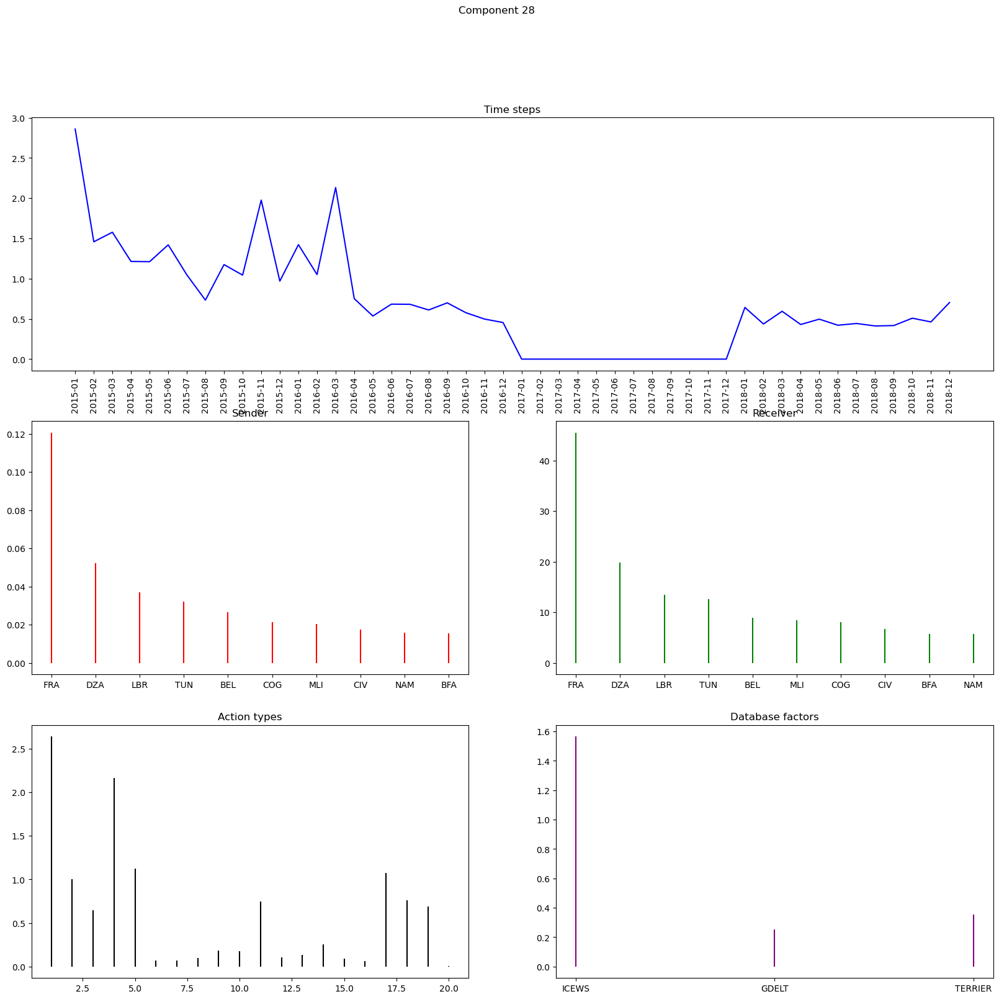

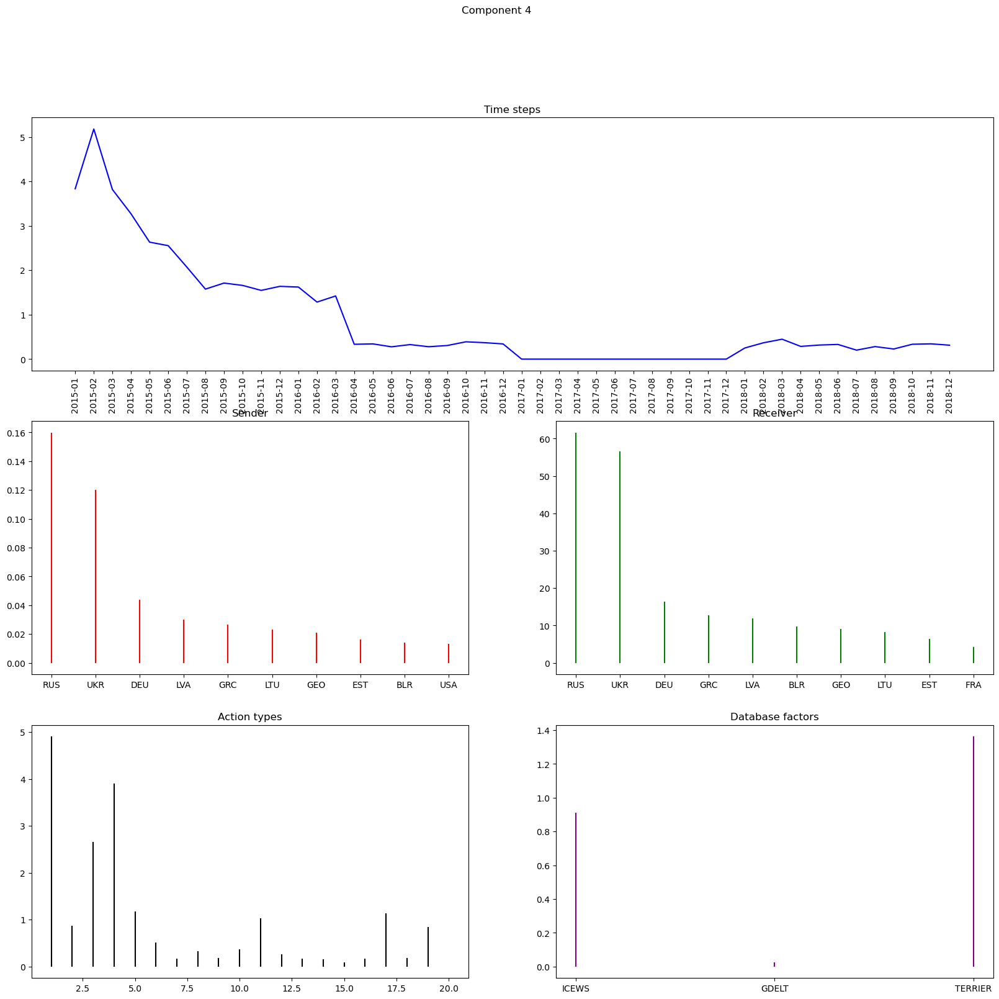

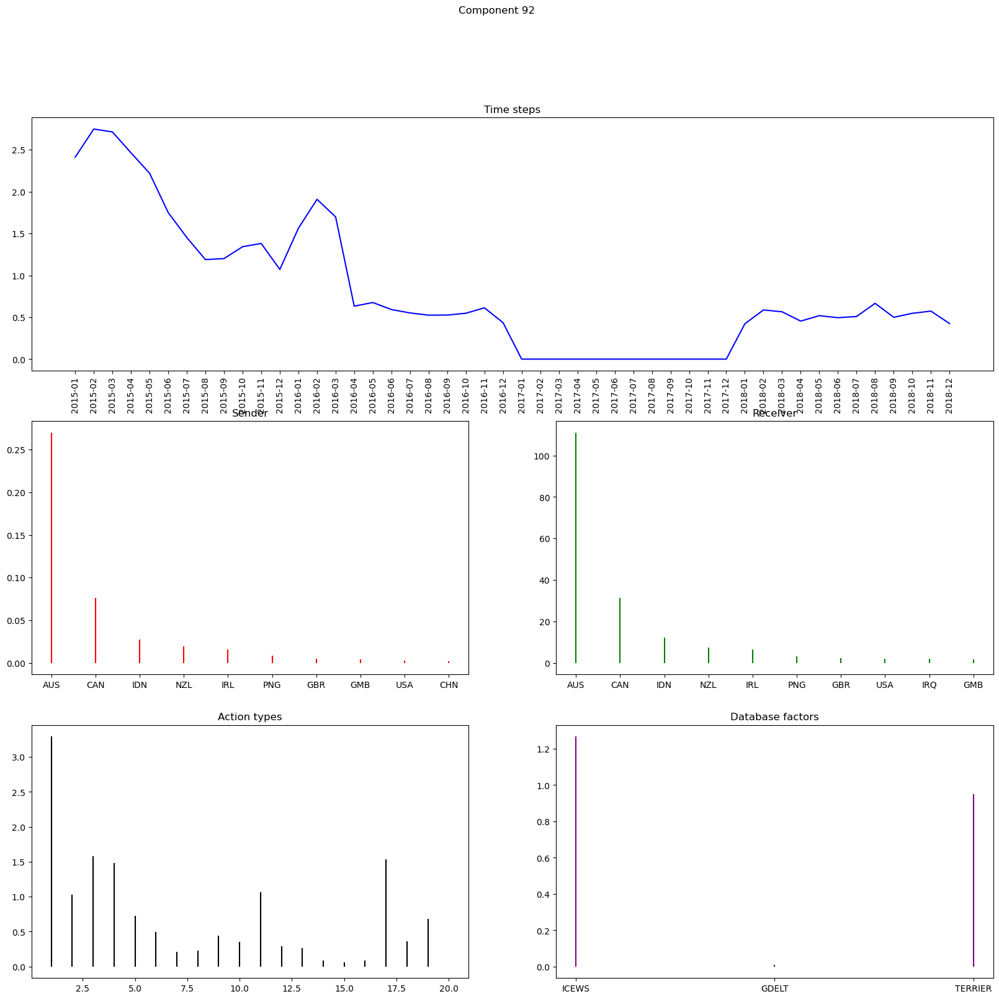

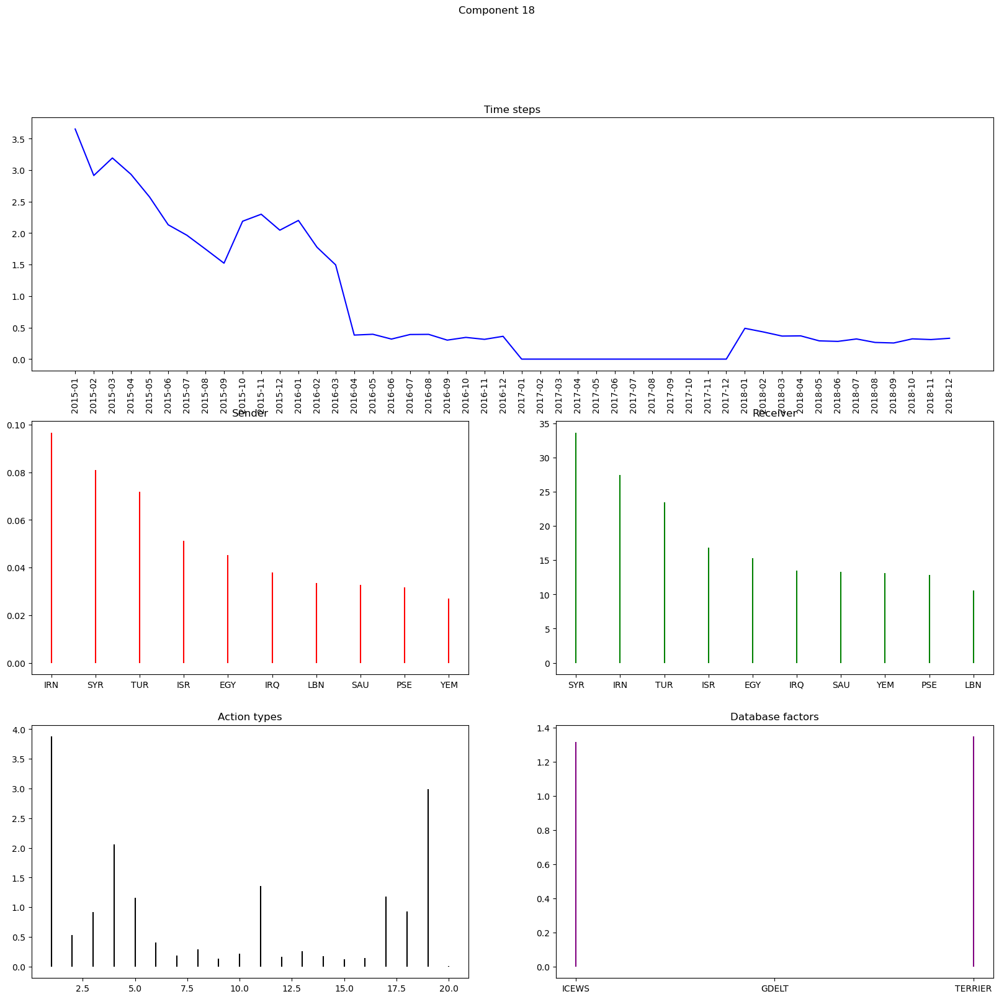

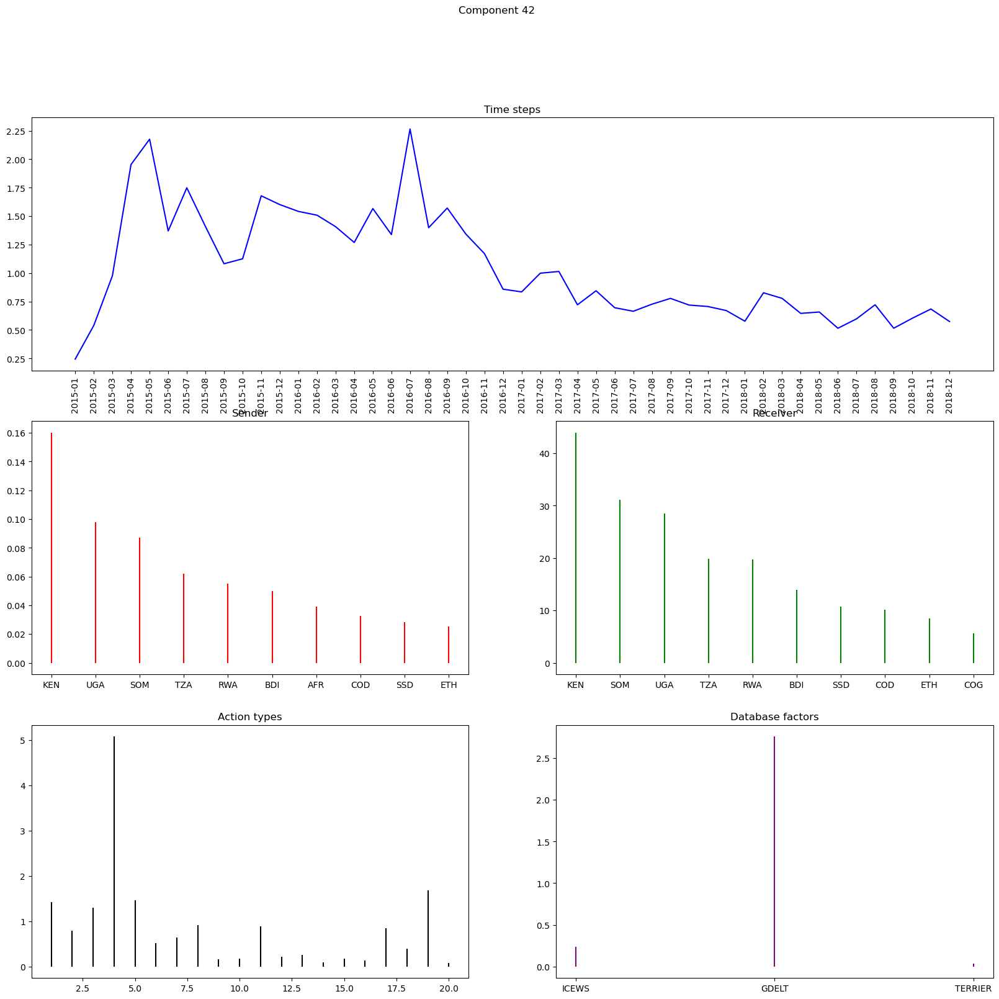

...

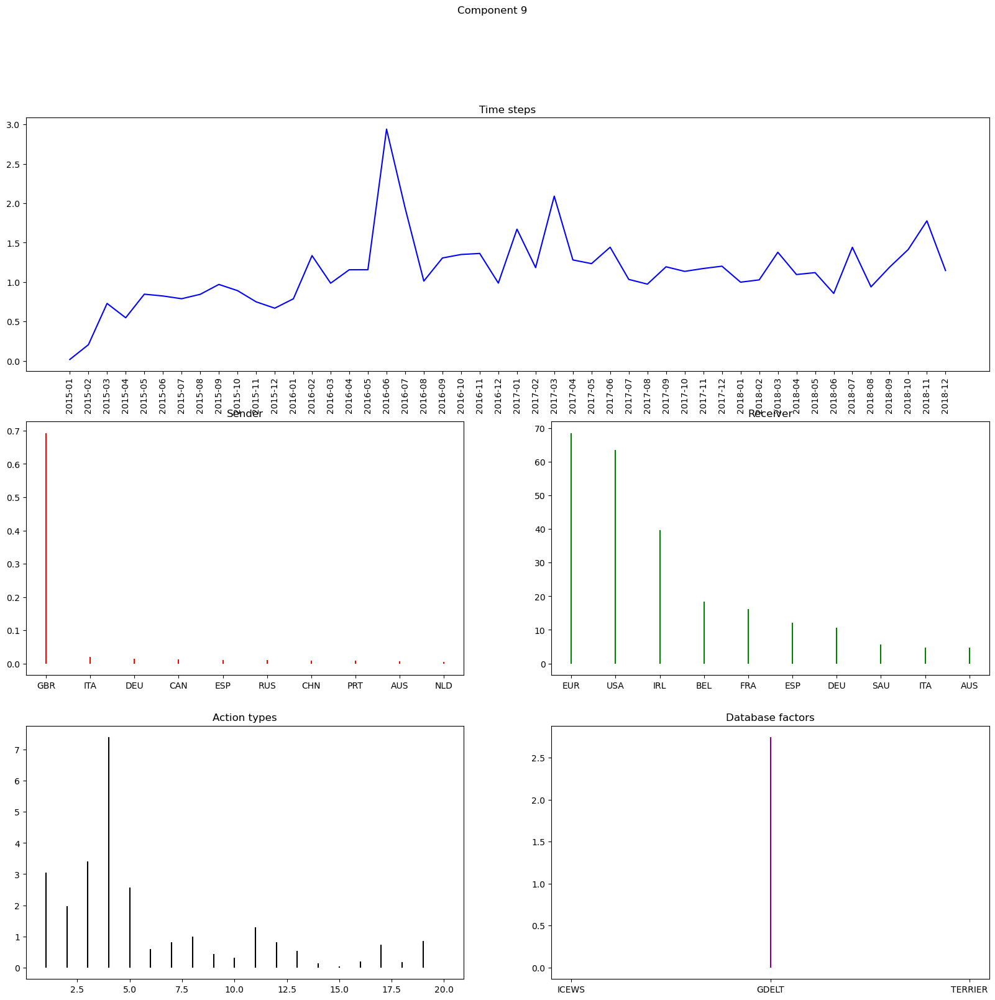

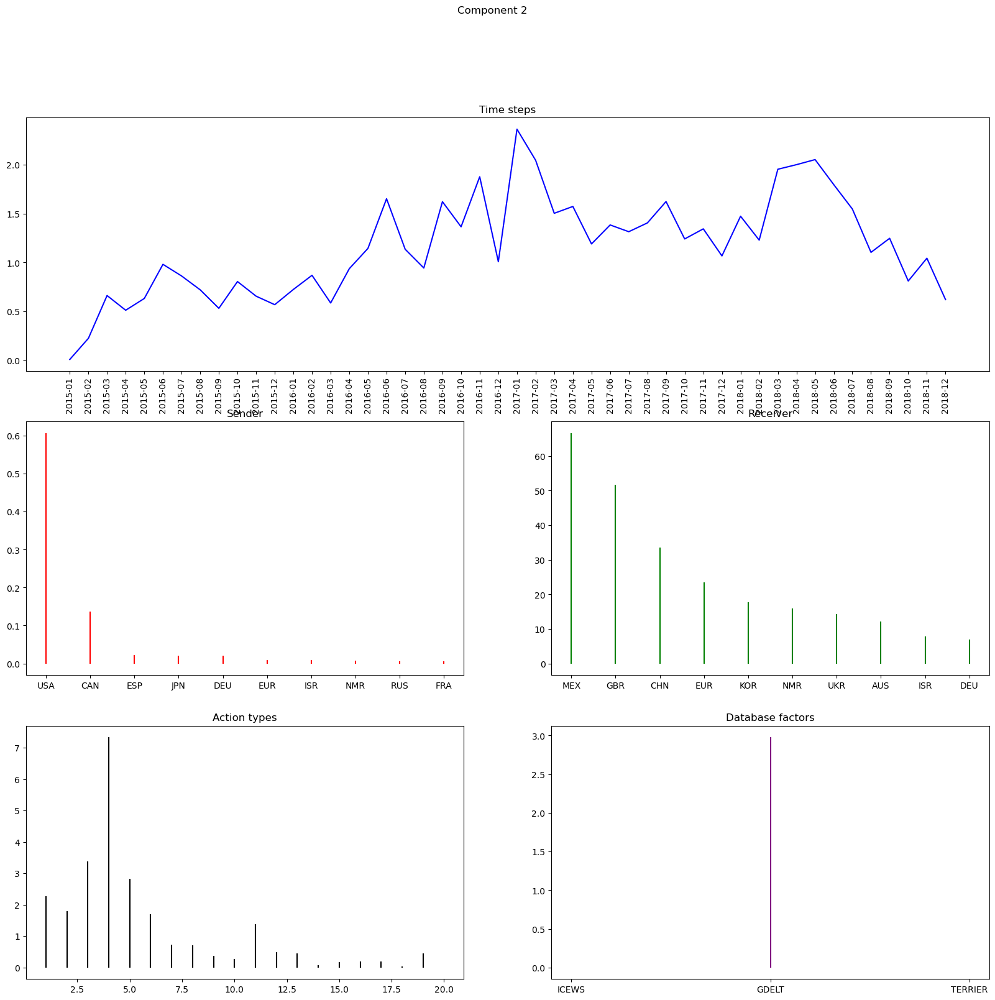

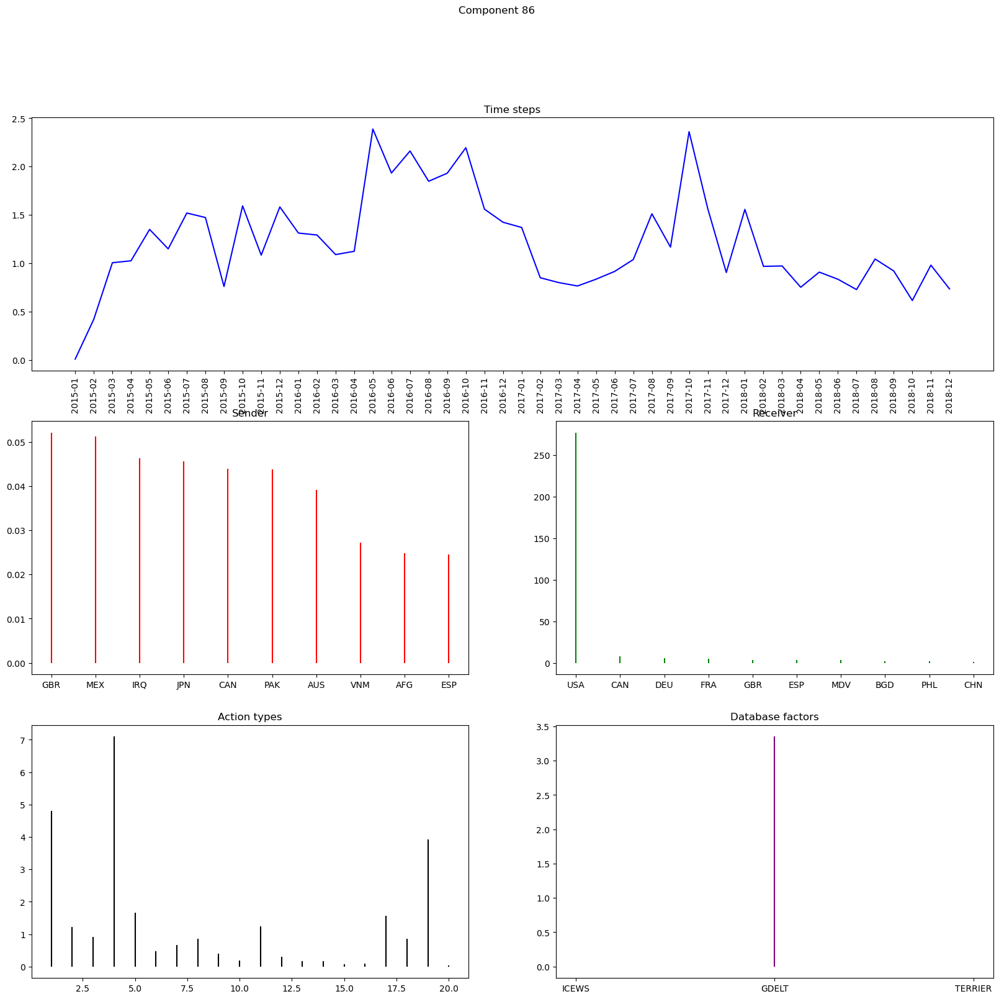

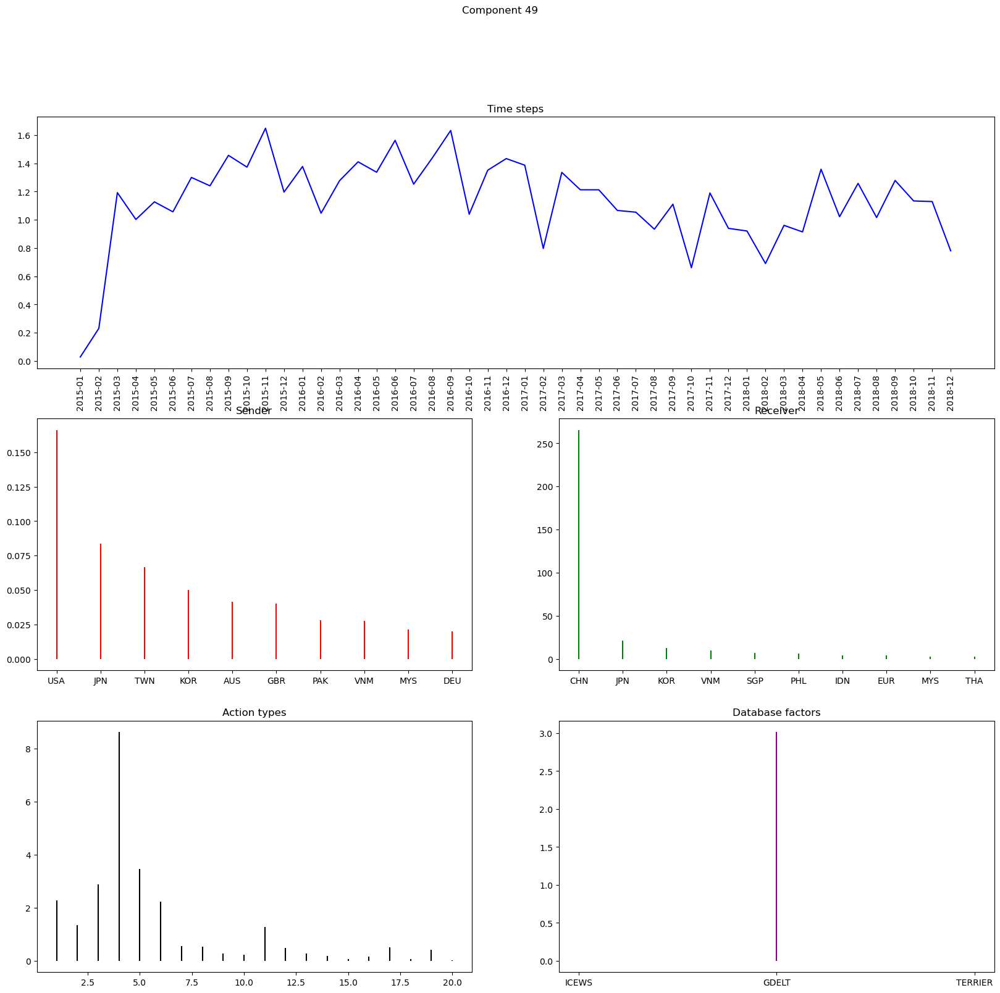

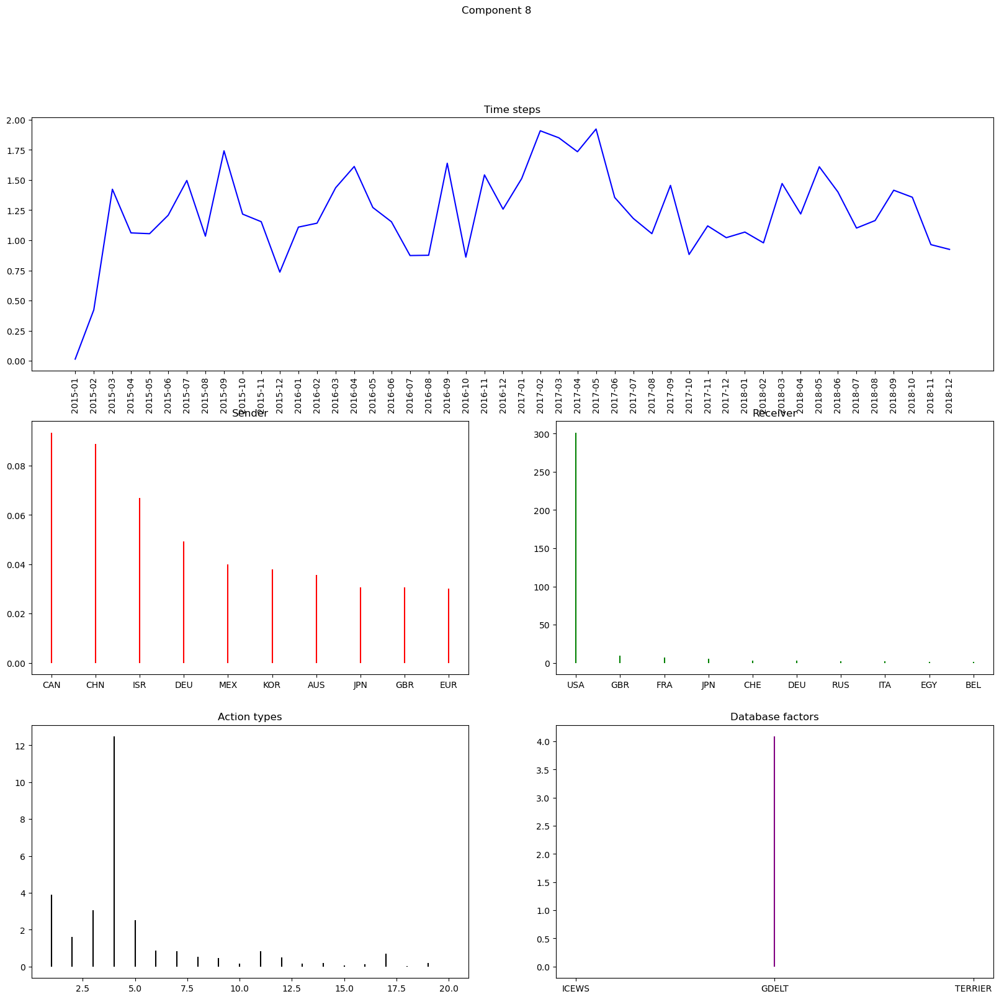

In [34]:
database_factor_matrix = bptf_5mode.G_DK_M[4]
database_factor_matrix = database_factor_matrix/database_factor_matrix.sum(axis=0,keepdims=1)
database_entropy = st.entropy(database_factor_matrix, axis=0)
database_components = pd.DataFrame({
    'ICEWS' : database_factor_matrix[0, :],
    'TERRIER' : database_factor_matrix[1, :],
    'GDELT' : database_factor_matrix[2, :],
    'entropy' : database_entropy,
    'index' : range(n_components)
}).sort_values(by='entropy', ascending=False)

def component_analysis_plot(component):

    fig = plt.figure(figsize=(20, 18))
    gs = fig.add_gridspec(3, 2, height_ratios=[1, 1, 1])

    ax1 = fig.add_subplot(gs[0, :])
    time_vector = bptf_5mode.G_DK_M[3][:, component]
    time_vector = pd.DataFrame({
        'time steps' : time_vector,
        'index' : range(time_vector.shape[0])
    })
    time_vector = pd.merge(
        left=time_vector, right=date_indices,
        how='left', on='index'
    )
    ax1.plot(time_vector['date'], time_vector['time steps'], color='b')
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_title('Time steps')

    ax2 = fig.add_subplot(gs[1, 0])
    sender_vector = bptf_5mode.G_DK_M[0][:, component]
    sender_vector = pd.DataFrame({
        'sender' : sender_vector,
        'index' : range(sender_vector.shape[0])})
    sender_vector = pd.merge(
        left=sender_vector, right=country_indices,
        how='left', on='index'
    ).sort_values(
        by='sender', 
        ascending=False).iloc[:10, :]
    ax2.vlines(x=sender_vector['country'], ymin=0, ymax=sender_vector['sender'], color='r')
    ax2.set_title('Sender')

    ax3 = fig.add_subplot(gs[1, 1])
    receiver_vector = bptf_5mode.G_DK_M[1][:, component]
    receiver_vector = pd.DataFrame({
        'receiver' : receiver_vector,
        'index' : range(receiver_vector.shape[0])})
    receiver_vector = pd.merge(
        left=receiver_vector, right=country_indices,
        how='left', on='index'
    ).sort_values(
        by='receiver', ascending=False
    ).iloc[:10, :]
    ax3.vlines(x=receiver_vector['country'], ymin=0, ymax=receiver_vector['receiver'], color='g')
    ax3.set_title('Receiver')

    ax4 = fig.add_subplot(gs[2, 0])
    action_vector = bptf_5mode.G_DK_M[2][:, component]
    action_vector = pd.DataFrame({
        'action' : action_vector,
        'action type' : range(1, 21)
    })
    ax4.vlines(x=action_vector['action type'], ymin=0, ymax=action_vector['action'], color='black')
    ax4.set_title('Action types')

    ax5 = fig.add_subplot(gs[2, 1])
    database_vector = bptf_5mode.G_DK_M[4][:, component]
    database_vector = pd.DataFrame({
        'factor' : database_vector,
        'index' : range(database_vector.shape[0])
    })
    database_vector = pd.merge(
        left=database_vector, right=database_indices,
        how='left', on='index'
    )
    ax5.vlines(x=database_vector['database'], ymin=0, ymax=database_vector['factor'], color='purple')
    ax5.set_title('Database factors')

    fig.suptitle('Component ' + str(component))

    plt.show()

for component in database_components['index']:
    component_analysis_plot(component)